<a href="https://colab.research.google.com/github/JustinShawAcademy/Machine-Learning-Zoomcamp/blob/main/02_MLZ_regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 02 - Data Preperation

In [1]:
!wget -O carprices.csv https://raw.githubusercontent.com/JustinShawAcademy/Machine-Learning-Zoomcamp/refs/heads/main/data/carprice_data.csv

--2025-10-08 21:58:07--  https://raw.githubusercontent.com/JustinShawAcademy/Machine-Learning-Zoomcamp/refs/heads/main/data/carprice_data.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1475504 (1.4M) [text/plain]
Saving to: ‘carprices.csv’

carprices.csv       100%[===================>]   1.41M  8.25MB/s    in 0.2s    

2025-10-08 21:58:08 (8.25 MB/s) - ‘carprices.csv’ saved [1475504/1475504]



In [2]:
!ls

carprices.csv  sample_data


In [3]:
import pandas as pd
df = pd.read_csv("carprices.csv")
df.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


### Standardization
Below, we can clean the column names by converting them to lowercase and replacing spaces with underscores so they’re consistent, easier to reference in code, and less prone to errors when working with different tools or libraries.



In [4]:
df.columns = df.columns.str.lower().str.replace(' ', '_')

We can also standardize all text entries (e.g., categories, names) by lowercasing and replacing spaces with underscores so they’re consistent, easier to compare, group, or merge, and less likely to cause errors due to formatting differences.

In [5]:
df.dtypes

,0
make,object
model,object
year,int64
engine_fuel_type,object
engine_hp,float64
engine_cylinders,float64
transmission_type,object
driven_wheels,object
number_of_doors,float64
market_category,object


In [6]:
df.dtypes == 'object'

,0
make,True
model,True
year,False
engine_fuel_type,True
engine_hp,False
engine_cylinders,False
transmission_type,True
driven_wheels,True
number_of_doors,False
market_category,True


In [7]:
df.dtypes[df.dtypes == 'object']

,0
make,object
model,object
engine_fuel_type,object
transmission_type,object
driven_wheels,object
market_category,object
vehicle_size,object
vehicle_style,object


In [8]:
list(df.dtypes[df.dtypes == 'object'].index)

['make',
 'model',
 'engine_fuel_type',
 'transmission_type',
 'driven_wheels',
 'market_category',
 'vehicle_size',
 'vehicle_style']

In [9]:
string_columns = list(df.dtypes[df.dtypes == 'object'].index)

for col in string_columns:
    df[col] = df[col].str.lower().str.replace(' ', '_')

In [10]:
df.head()

,make,model,year,engine_fuel_type,engine_hp,engine_cylinders,transmission_type,driven_wheels,number_of_doors,market_category,vehicle_size,vehicle_style,highway_mpg,city_mpg,popularity,msrp
0,bmw,1_series_m,2011,premium_unleaded_(required),335.0,6.0,manual,rear_wheel_drive,2.0,"factory_tuner,luxury,high-performance",compact,coupe,26,19,3916,46135
1,bmw,1_series,2011,premium_unleaded_(required),300.0,6.0,manual,rear_wheel_drive,2.0,"luxury,performance",compact,convertible,28,19,3916,40650
2,bmw,1_series,2011,premium_unleaded_(required),300.0,6.0,manual,rear_wheel_drive,2.0,"luxury,high-performance",compact,coupe,28,20,3916,36350
3,bmw,1_series,2011,premium_unleaded_(required),230.0,6.0,manual,rear_wheel_drive,2.0,"luxury,performance",compact,coupe,28,18,3916,29450
4,bmw,1_series,2011,premium_unleaded_(required),230.0,6.0,manual,rear_wheel_drive,2.0,luxury,compact,convertible,28,18,3916,34500


## 03-EDA

In [11]:
for col in df.columns:
  print(col)
  print(df[col].unique()[:5])
  print(df[col].nunique())
  print()

make
['bmw' 'audi' 'fiat' 'mercedes-benz' 'chrysler']
48

model
['1_series_m' '1_series' '100' '124_spider' '190-class']
914

year
[2011 2012 2013 1992 1993]
28

engine_fuel_type
['premium_unleaded_(required)' 'regular_unleaded'
 'premium_unleaded_(recommended)' 'flex-fuel_(unleaded/e85)' 'diesel']
10

engine_hp
[335. 300. 230. 320. 172.]
356

engine_cylinders
[ 6.  4.  5.  8. 12.]
9

transmission_type
['manual' 'automatic' 'automated_manual' 'direct_drive' 'unknown']
5

driven_wheels
['rear_wheel_drive' 'front_wheel_drive' 'all_wheel_drive'
 'four_wheel_drive']
4

number_of_doors
[ 2.  4.  3. nan]
3

market_category
['factory_tuner,luxury,high-performance' 'luxury,performance'
 'luxury,high-performance' 'luxury' 'performance']
71

vehicle_size
['compact' 'midsize' 'large']
3

vehicle_style
['coupe' 'convertible' 'sedan' 'wagon' '4dr_hatchback']
16

highway_mpg
[26 28 27 25 24]
59

city_mpg
[19 20 18 17 16]
69

popularity
[3916 3105  819  617 1013]
48

msrp
[46135 40650 36350 29450 345

Now let's look at the distrobution of price:

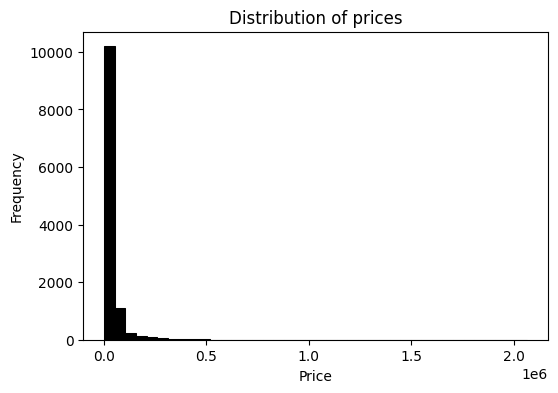

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 4))

sns.histplot(df.msrp, bins=40, color='black', alpha=1)
plt.ylabel('Frequency')
plt.xlabel('Price')
plt.title('Distribution of prices')

plt.show()

Our data falls into a long tail distrobution

> Later: How do deal with it? what are the cons?

In [13]:
df['msrp'].min(), df['msrp'].max()

(2000, 2065902)

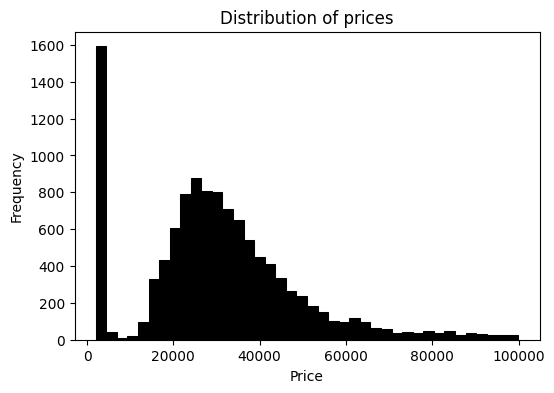

In [14]:
plt.figure(figsize=(6, 4))

sns.histplot(df.msrp[df.msrp < 100000], bins=40, color='black', alpha=1)
plt.ylabel('Frequency')
plt.xlabel('Price')
plt.title('Distribution of prices')

plt.show()

In [15]:
import numpy as np

np.log([0, 1, 10, 100, 1000, 10000])

/tmp/ipython-input-515245073.py:3: RuntimeWarning: divide by zero encountered in log
  np.log([0, 1, 10, 100, 1000, 10000])


array([      -inf, 0.        , 2.30258509, 4.60517019, 6.90775528,
       9.21034037])

In [16]:
np.log([0+1, 1+1, 10+1, 100+1, 1000+1, 10000+1])

array([0.        , 0.69314718, 2.39789527, 4.61512052, 6.90875478,
       9.21044037])

In [17]:
# But theres this numpy function that add ones to our list we want to log
np.log1p([0, 1, 10, 100, 1000, 10000])

array([0.        , 0.69314718, 2.39789527, 4.61512052, 6.90875478,
       9.21044037])

In [18]:
price_logs = np.log1p(df.msrp)
price_logs.min(), price_logs.max()

(7.601402334583733, 14.54107797693027)

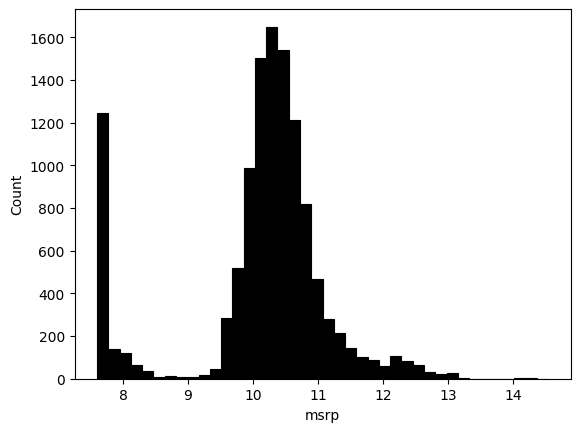

In [19]:
sns.histplot(price_logs, bins=40, color='black', alpha=1);
# now the tail is gone

Now we have a normal like distrobution. This is ideal for models if our target variable looks like this. long tail distrobitions usally confuse models

### missing values

In [20]:
df.isnull().sum()

,0
make,0
model,0
year,0
engine_fuel_type,3
engine_hp,69
engine_cylinders,30
transmission_type,0
driven_wheels,0
number_of_doors,6
market_category,3742


We must keep this in mind when we train the model

## 04-validation-framework

![train_valid_test_split](https://i.sstatic.net/FnY8G.png)

In [21]:
np.random.seed(42)

n = len(df)

n_val = int(0.2 * n)
n_test = int(0.2 * n)
n_train = n - (n_val + n_test)

print(
    f"n_val   = {n_val}\n"
    f"n_test  = {n_test}\n"
    f"n_train = {n_train}\n"
    f"Total   = {n_val + n_test + n_train} (n = {n})"
)

n_val   = 2382
n_test  = 2382
n_train = 7150
Total   = 11914 (n = 11914)


In [22]:
df_train = df.iloc[:n_train]
df_val = df.iloc[n_train:n_train+n_val]
df_test = df.iloc[n_train+n_val:]
# But there is a problem with this code. the data right now is group by `make`. this is not good for training or testing.
# we want to suffle. all good practice to break order

In [23]:
idx = np.arange(n)
np.random.shuffle(idx)

df_shuffled = df.iloc[idx]
df_shuffled.head()

,make,model,year,engine_fuel_type,engine_hp,engine_cylinders,transmission_type,driven_wheels,number_of_doors,market_category,vehicle_size,vehicle_style,highway_mpg,city_mpg,popularity,msrp
3995,gmc,envoy_xl,2005,regular_unleaded,275.0,6.0,automatic,rear_wheel_drive,4.0,NaN,large,4dr_suv,18,13,549,29695
7474,volkswagen,passat,2016,regular_unleaded,170.0,4.0,automatic,front_wheel_drive,4.0,NaN,midsize,sedan,38,25,873,30495
7300,honda,odyssey,2016,regular_unleaded,248.0,6.0,automatic,front_wheel_drive,4.0,NaN,large,passenger_minivan,28,19,2202,37650
3148,chevrolet,cruze,2015,regular_unleaded,138.0,4.0,manual,front_wheel_drive,4.0,NaN,midsize,sedan,36,25,1385,16170
747,volvo,740,1991,regular_unleaded,162.0,4.0,automatic,rear_wheel_drive,4.0,"luxury,performance",midsize,sedan,20,17,870,2000


In [24]:
df_train = df_shuffled.iloc[:n_train].copy()
df_val = df_shuffled.iloc[n_train:n_train+n_val].copy()
df_test = df_shuffled.iloc[n_train+n_val:].copy()

In [25]:
y_train_orig = df_train.msrp.values
y_val_orig = df_val.msrp.values
y_test_orig = df_test.msrp.values

y_train = np.log1p(df_train.msrp.values)
y_val = np.log1p(df_val.msrp.values)
y_test = np.log1p(df_test.msrp.values)

# We do this because we don't want to use msrp as a feature to predict msrp.
# It's a good practice as we don't want to use for training purposes
del df_train['msrp']
del df_val['msrp']
del df_test['msrp']

## 05-linear-regression-simple
*come back to this with more notes*

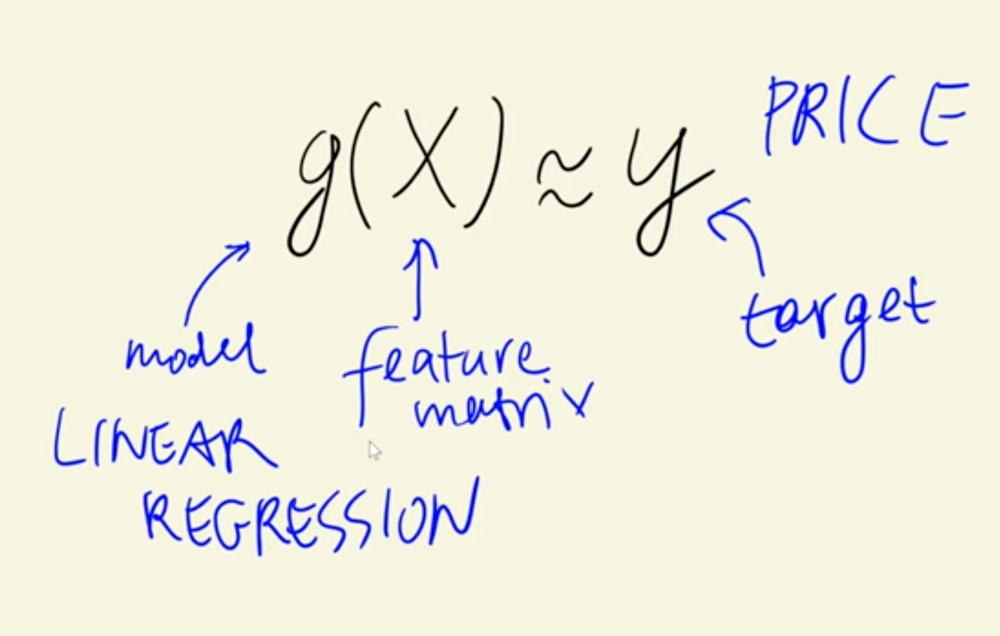

X is only training dtata

above this the crux of ML

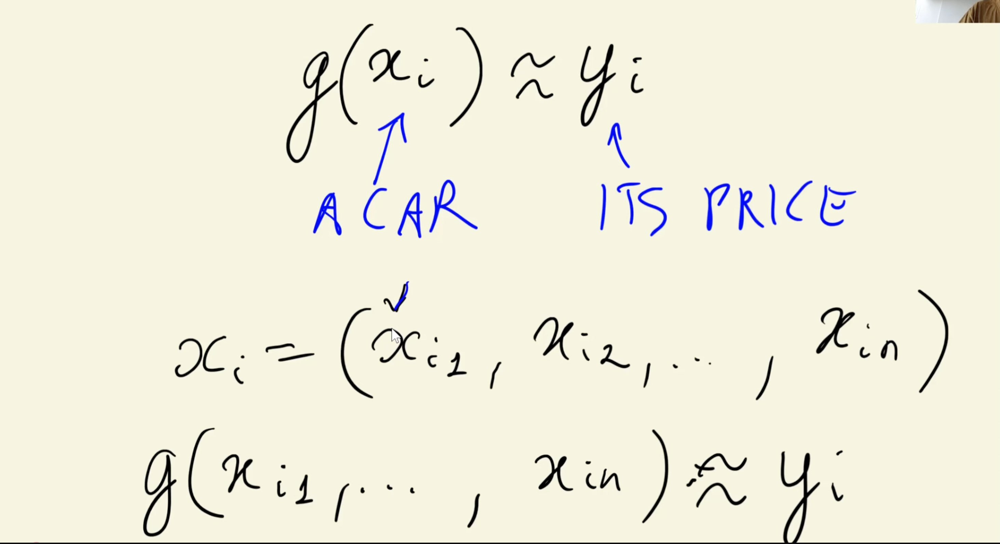



if we just want one prediction (one classification) we can take xi (which is a vector of features) (note that a feature is column and x is the row) (note that a feature could be like make, mpg, year, etc)

In [26]:
# an example of a random car and it's features
df_train.iloc[10]

,11815
make,toyota
model,yaris
year,2015
engine_fuel_type,regular_unleaded
engine_hp,106.0
engine_cylinders,4.0
transmission_type,manual
driven_wheels,front_wheel_drive
number_of_doors,2.0
market_category,hatchback


we want to take, engine_hp, city_mpg, and popularity.

> But how do we know know what to take?

In [27]:
xi = [106,  # engine_hp
      30,   # city_mpg
      2031] # popularity
# let's take a xi vector

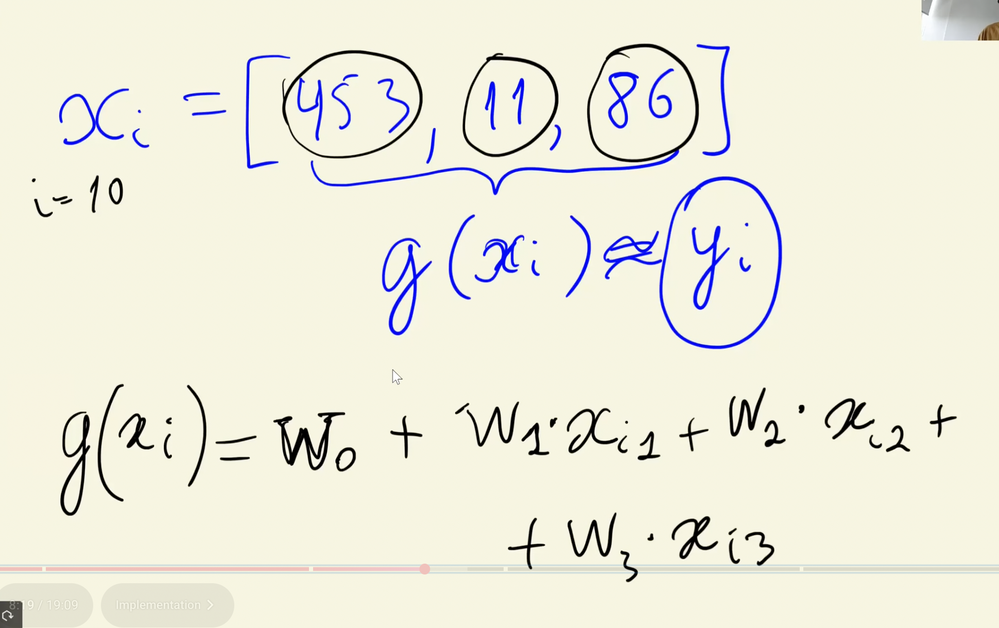

makeing it more compact

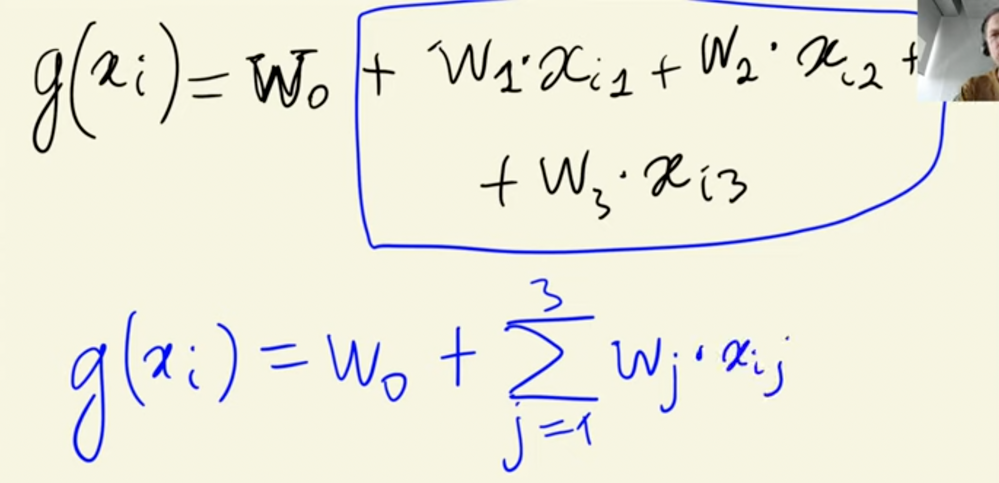

In [28]:
xi = [106, 30, 2031]
w0 = 0
w = [1, 1, 1]

In [29]:
def linear_regression(xi):
    n = len(xi)
    pred = w0

    for j in range(n):
        pred = pred + w[j] * xi[j]

    return pred

In [30]:
linear_regression(xi)

2167

In [31]:
# let's pick arbitary weights for our weights vector and bias term
xi = [106, 30, 2031]
w0 = 7.17
w = [0.01, 0.04, 0.002]
linear_regression(xi)

13.492

In [32]:
# recall that our data was logged so to get the normal price back we do the opposite
print(np.exp(linear_regression(xi)))

723604.3180935134


more generic would be n ($sum) j = 0

note that w0 is the bais term. this is the value if we know abosoulty nothing about the car.

## 06 - linear-regression-vector

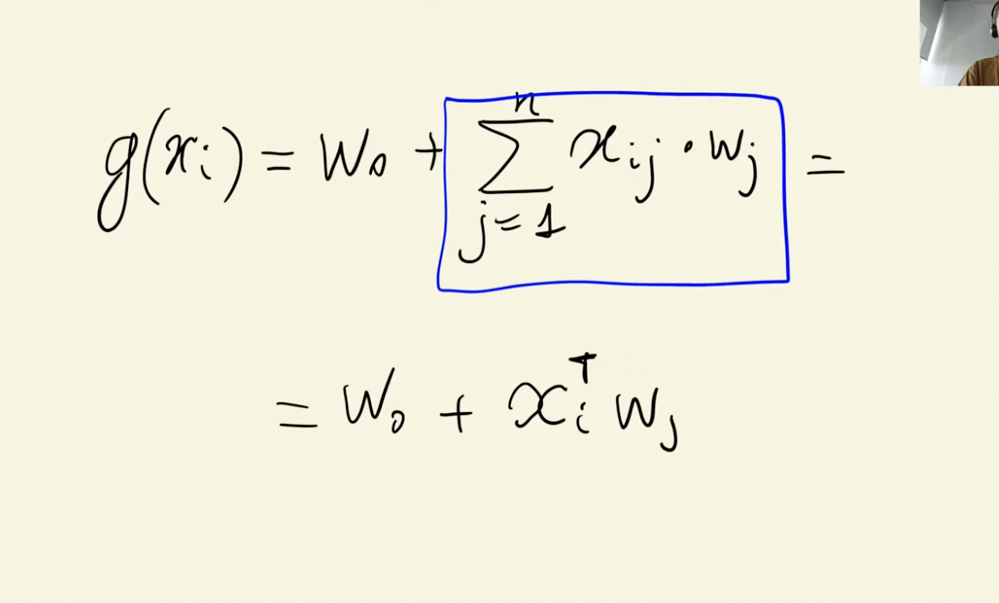

note that the blue box is essentially  just a dot product

In [33]:
def dot(xi, w):
    n = len(xi)
    res = 0.0

    for j in range(n):
        res = res + xi[j] * w[j]

    return res

In [34]:
def linear_regression(xi):
    return w0 + dot(xi, w)

but we want the bias term (w0 above) to be in the matrix multipcation (dot)

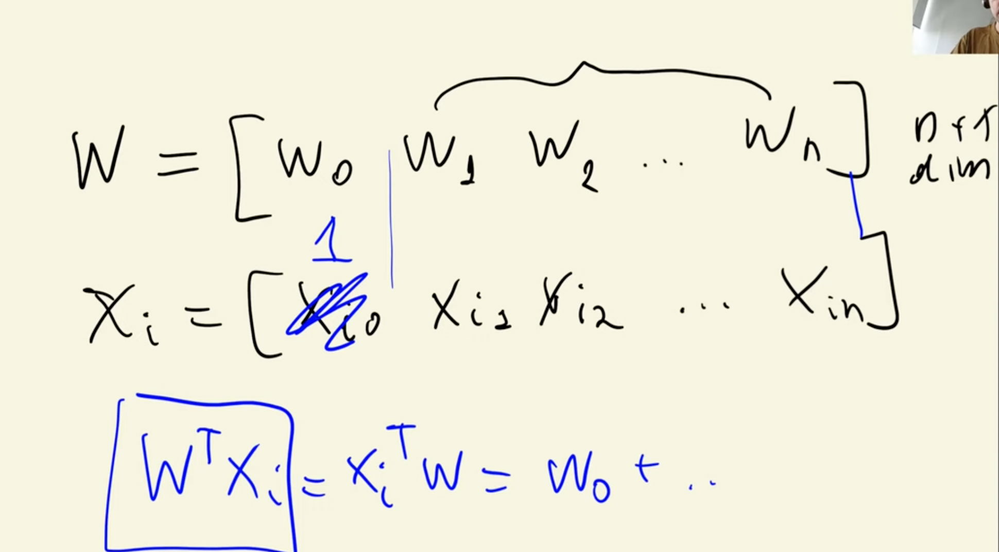

n + 1 dim | it should be w@xiT not what it says because that gives a nxn and we want a 1x1

In [35]:
w_new = [w0] + w

In [36]:
def linear_regression(xi):
  xi = [1] + xi
  return dot(xi, w_new)

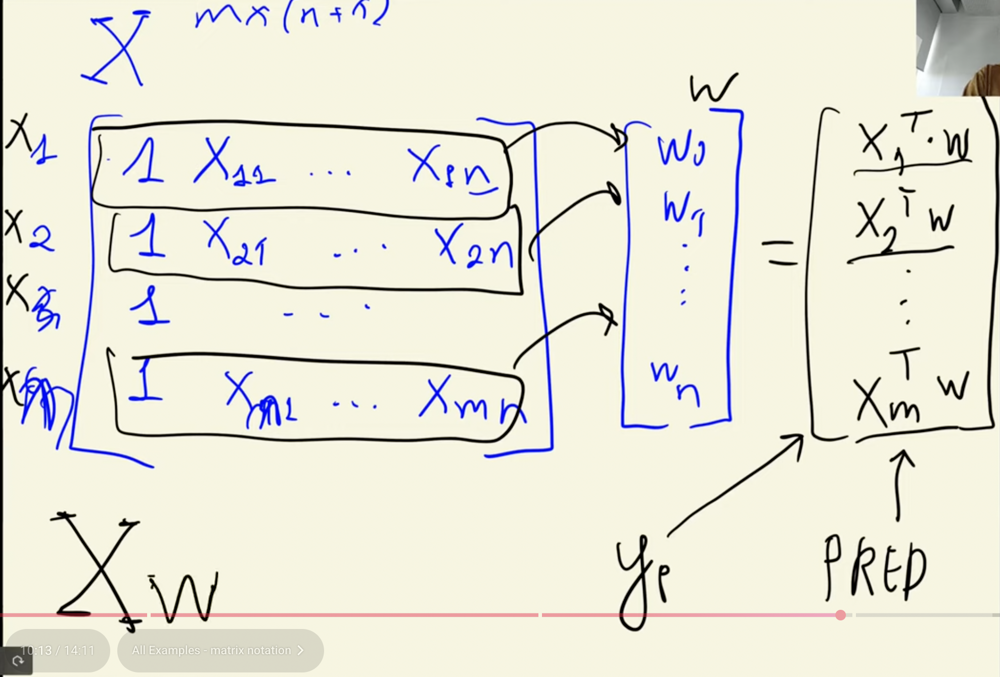

read this for an explination for above: https://chatgpt.com/c/68e2fcad-2678-8332-893f-ad2e37e3b205

linear regession is basically matrix multiplication

In [37]:
w0 = 7.17
w = [0.01, 0.04, 0.002]
w_new = [w0] + w

In [38]:
x1 = [1, 148, 24, 1385]
x2 = [1, 132, 25, 2031]
x10 = [1, 453, 11, 86]

X = [x1, x2, x10]
X = np.array(X)

In [39]:
def linear_regression(X):
  return X.dot(w_new)
# our predictions for the price of the car

In [40]:
linear_regression(X)

array([12.38 , 13.552, 12.312])

## 07-linear-regression-training
by now you must be thinking, how do we get the weight to make the predictions?

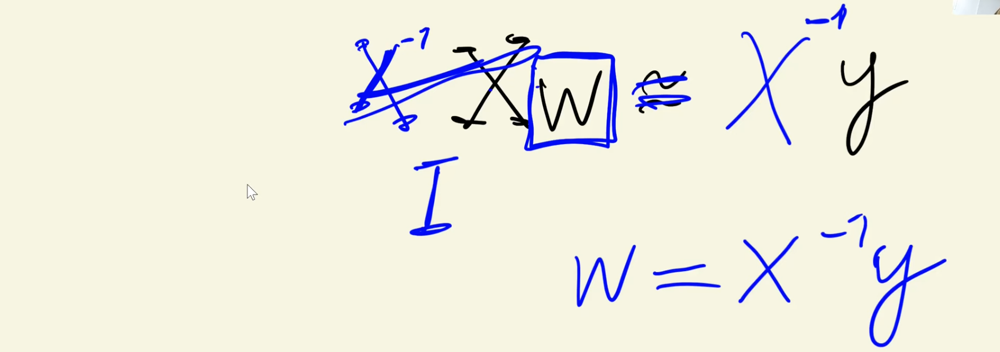

if X is a invertible square matrix. but our x is a rectangular matrix there the inverse does not exsit

we can try to find a approxi for this solution using GRAM matrix

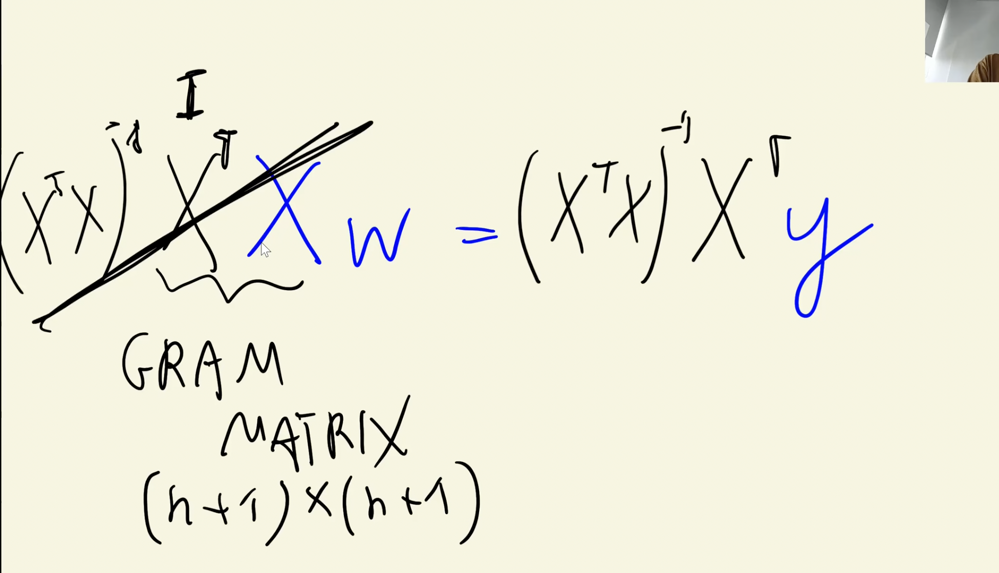

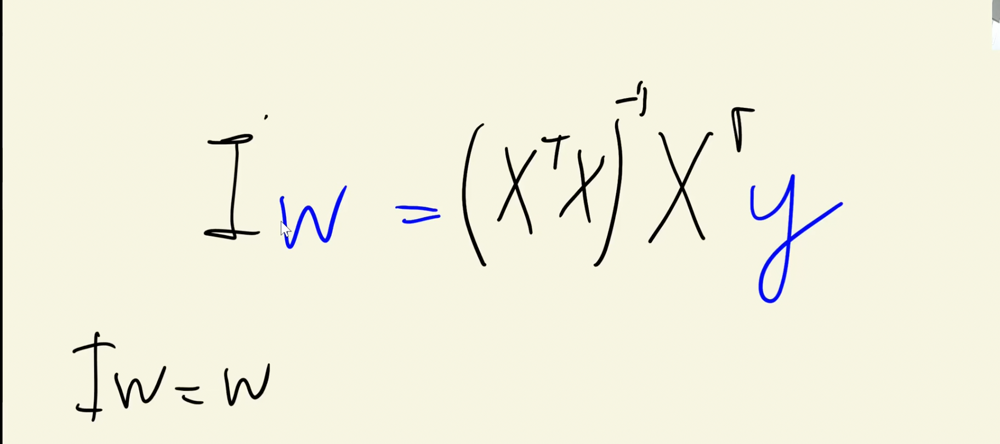

but note that we can just write w = * because Iw = w

In [41]:
# We want a function like this:
def train_linear_regression(X, y):
    pass


In [42]:
X = [
    [148, 24, 1385],
    [132, 25, 2031],
    [453, 11, 86],
    [158, 24, 185],
    [172, 25, 201],
    [413, 11, 86],
    [38,  54, 185],
    [142, 25, 431],
    [453, 31, 86],
]

X = np.array(X)
X
# but we're missing a columns of 1's for our bias term

array([[ 148,   24, 1385],
       [ 132,   25, 2031],
       [ 453,   11,   86],
       [ 158,   24,  185],
       [ 172,   25,  201],
       [ 413,   11,   86],
       [  38,   54,  185],
       [ 142,   25,  431],
       [ 453,   31,   86]])

In [43]:
ones = np.ones(X.shape[0])
ones

array([1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [44]:
X = np.column_stack([ones, X])
X

array([[1.000e+00, 1.480e+02, 2.400e+01, 1.385e+03],
       [1.000e+00, 1.320e+02, 2.500e+01, 2.031e+03],
       [1.000e+00, 4.530e+02, 1.100e+01, 8.600e+01],
       [1.000e+00, 1.580e+02, 2.400e+01, 1.850e+02],
       [1.000e+00, 1.720e+02, 2.500e+01, 2.010e+02],
       [1.000e+00, 4.130e+02, 1.100e+01, 8.600e+01],
       [1.000e+00, 3.800e+01, 5.400e+01, 1.850e+02],
       [1.000e+00, 1.420e+02, 2.500e+01, 4.310e+02],
       [1.000e+00, 4.530e+02, 3.100e+01, 8.600e+01]])

In [45]:
XTX = X.T.dot(X)
XTX

array([[9.000000e+00, 2.109000e+03, 2.300000e+02, 4.676000e+03],
       [2.109000e+03, 6.964710e+05, 4.411500e+04, 7.185400e+05],
       [2.300000e+02, 4.411500e+04, 7.146000e+03, 1.188030e+05],
       [4.676000e+03, 7.185400e+05, 1.188030e+05, 6.359986e+06]])

In [46]:
XTX_inv = np.linalg.inv(XTX)
XTX_inv


array([[ 3.30686958e+00, -5.39612291e-03, -6.21325581e-02,
        -6.61016816e-04],
       [-5.39612291e-03,  1.11633857e-05,  8.66973393e-05,
         1.08664195e-06],
       [-6.21325581e-02,  8.66973393e-05,  1.46189255e-03,
         8.57849603e-06],
       [-6.61016816e-04,  1.08664195e-06,  8.57849603e-06,
         3.60215866e-07]])

In [47]:
# identity matrix
XTX_inv.dot(XTX)
# small numbers because of machine percison

array([[ 1.00000000e+00, -1.10748043e-12, -1.65667393e-13,
         8.21071509e-13],
       [ 2.75793928e-18,  1.00000000e+00, -3.77759754e-17,
         1.83712298e-15],
       [ 6.28430684e-17,  2.03945883e-14,  1.00000000e+00,
        -1.38348195e-14],
       [ 2.35051643e-20,  5.01606559e-17, -2.85608922e-19,
         1.00000000e+00]])

In [48]:
XTX_inv.dot(XTX).round()

array([[ 1., -0., -0.,  0.],
       [ 0.,  1., -0.,  0.],
       [ 0.,  0.,  1., -0.],
       [ 0.,  0., -0.,  1.]])

In [49]:
y = [1100, 200, 150, 250, 100, 200, 150, 250, 120]

In [50]:
w = XTX_inv.dot(X.T).dot(y)
wo = w[0]
w = w[1:]
wo, w

(np.float64(401.6214706729436), array([-0.38594912, -4.91165493,  0.18157701]))

In [51]:
# wrapping it up
def train_linear_regression(X, y):
    ones = np.ones(X.shape[0])
    X = np.column_stack([ones, X])

    XTX = X.T.dot(X)
    XTX_inv = np.linalg.inv(XTX)
    w = XTX_inv.dot(X.T).dot(y)

    return w[0], w[1:]

In [52]:
X = [
    [148, 24, 1385],
    [132, 25, 2031],
    [453, 11, 86],
    [158, 24, 185],
    [172, 25, 201],
    [413, 11, 86],
    [38,  54, 185],
    [142, 25, 431],
    [453, 31, 86],
]
X = np.array(X)
X

array([[ 148,   24, 1385],
       [ 132,   25, 2031],
       [ 453,   11,   86],
       [ 158,   24,  185],
       [ 172,   25,  201],
       [ 413,   11,   86],
       [  38,   54,  185],
       [ 142,   25,  431],
       [ 453,   31,   86]])

In [53]:
w0, w = train_linear_regression(X, y)
w0, w

(np.float64(401.6214706729436), array([-0.38594912, -4.91165493,  0.18157701]))

## 08-baseline-model

In [54]:
df_train.dtypes

,0
make,object
model,object
year,int64
engine_fuel_type,object
engine_hp,float64
engine_cylinders,float64
transmission_type,object
driven_wheels,object
number_of_doors,float64
market_category,object


In [55]:
base = ['engine_hp', 'engine_cylinders' , 'highway_mpg', 'city_mpg', 'popularity']

In [56]:
X_train = df_train[base]

In [57]:
train_linear_regression(X_train, y_train)
# There's a problem here. Some of our rows may have Nan

(np.float64(nan), array([nan, nan, nan, nan, nan]))

In [58]:
X_train.isnull().sum()
# We need something to do with them

,0
engine_hp,52
engine_cylinders,16
highway_mpg,0
city_mpg,0
popularity,0


In [59]:
# can we just do X_train.fillna(0)??
X_train = X_train.fillna(0)

In [60]:
X_train.isnull().sum()

,0
engine_hp,0
engine_cylinders,0
highway_mpg,0
city_mpg,0
popularity,0


In [61]:
X_train.shape, y_train.shape

((7150, 5), (7150,))

In [62]:
w0, w = train_linear_regression(X_train, y_train)

In [63]:
y_pred = w0 + X_train.dot(w)
y_pred.shape

(7150,)

<Axes: ylabel='Count'>

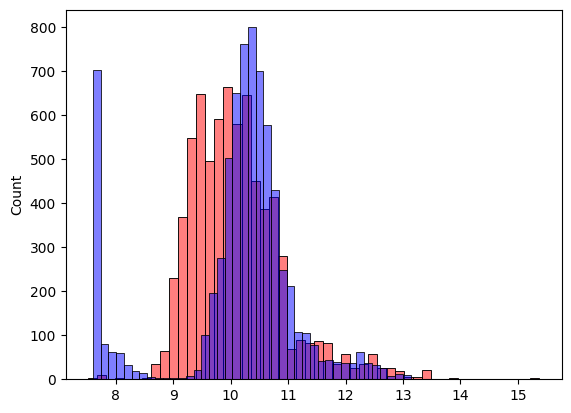

In [64]:
sns.histplot(y_pred, color='red', alpha=0.5, bins=50)
sns.histplot(y_train, color='blue', alpha=0.5, bins=50)

it seems to be predicting smaller values each time. our model may not be ideal. But how can we objectivly say that?

2.9 root-mean-squared-error

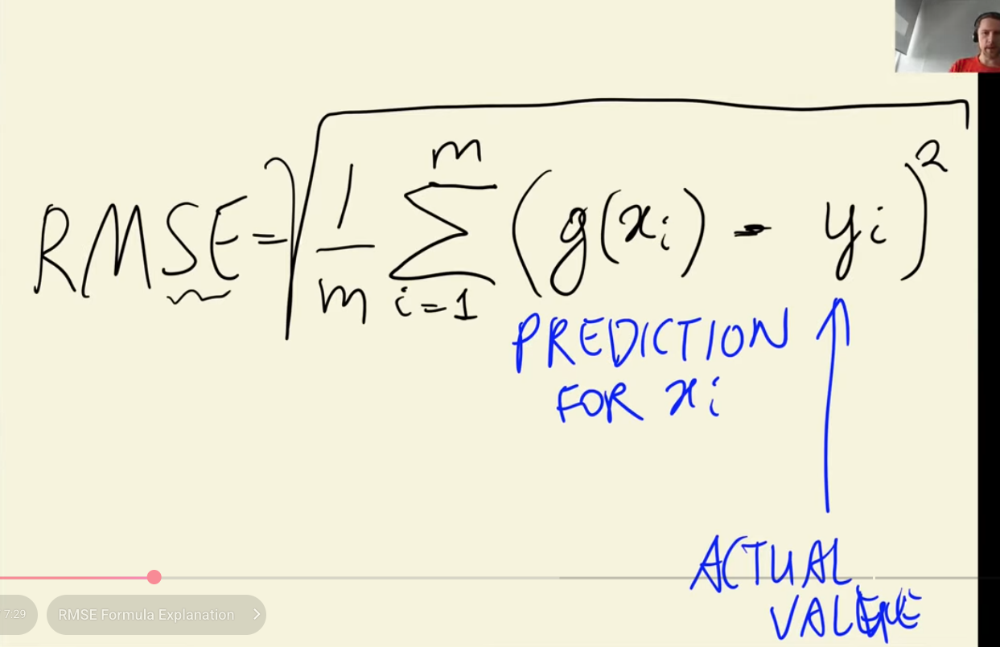

In [65]:
def rmse(y, y_pred):
  se = (y - y_pred) ** 2
  mse = se.mean()
  return np.sqrt(mse)

rmse(y_train, y_pred)

np.float64(0.7570200472453602)

## 10-car-price-validation

In [66]:
def prepare_X(df, base):
  df_num = df[base]
  df_num = df_num.fillna(0)
  X = df_num.values
  return X

In [67]:
# Train
X_train = prepare_X(df_train, base)
w0, w = train_linear_regression(X_train, y_train)

# Val
X_val = prepare_X(df_val, base)
y_pred = w0 + X_val.dot(w)

rmse(y_val, y_pred)

np.float64(0.7398184285113428)

## 11-feature-engineering

In [68]:
# what year is this data from?
df_train['year'].max()

2017

In [69]:
# we can find the age of cars doing this:
2017 - df_train['year']
# now we have a column for age of the car

,year
3995,12
7474,1
7300,1
3148,2
747,26
...,...
10845,14
4861,2
2334,11
8651,12


In [70]:
def prepare_X(df, base):
  df = df.copy()                  # we don't want to change the original df
  df['age'] = 2017 - df['year']
  features = base + ['age']

  df_num = df[features]
  df_num = df_num.fillna(0)
  X = df_num.values
  return X

In [71]:
# Train
X_train = prepare_X(df_train, base)
w0, w = train_linear_regression(X_train, y_train)

# Val
X_val = prepare_X(df_val, base)
y_pred = w0 + X_val.dot(w)

rmse(y_val, y_pred)

np.float64(0.5133241025826359)

our result is better as we can see by the RSME and visually below

<Axes: ylabel='Count'>

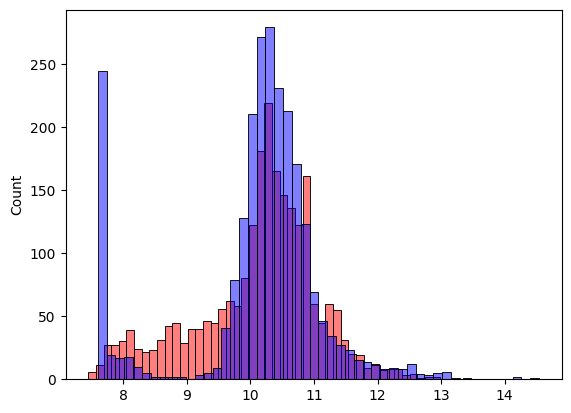

In [72]:
sns.histplot(y_pred, color='red', alpha=0.5, bins=50)
sns.histplot(y_val, color='blue', alpha=0.5, bins=50)

## 12-categorical-variables